# MACHINE LEARNING PROJECT

## Project Name:  Predict Song Popularity By Using Machine Learning

## Project by- Shraddha Nitin Kadam

## Guided by- Sameer Warsolkar Sir

# Abstract

This dataset is specifically designed for predicting song popularity using regression techniques. It’s sourced from Kaggle and contains information about song features.The dataset includes columns such as acousticness, danceability, energy, and more.It consists of 130,663 entries with 17 columns related to song attributes and popularity.
This project aims to predict the popularity of songs using machine learning techniques. By analyzing a dataset from Spotify, various features such as acousticness, danceability, energy, and more were used to train multiple models.This project highlights the potential of machine learning in the music industry for predicting song popularity.

In [1]:
#importing libraries that are essential for the project.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('SpotifySongPolularityExtract.csv')

In [3]:
df

,artist_name,track_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
0,YG,2RM4jf1Xa9zPgMGRDiht8O,"Big Bank feat. 2 Chainz, Big Sean, Nicki Minaj",0.005820,0.743,238373,0.339,0.000,1,0.0812,-7.678,1,0.4090,203.927,4,0.1180,15
1,YG,1tHDG53xJNGsItRA3vfVgs,BAND DRUM (feat. A$AP Rocky),0.024400,0.846,214800,0.557,0.000,8,0.2860,-7.259,1,0.4570,159.009,4,0.3710,0
2,R3HAB,6Wosx2euFPMT14UXiWudMy,Radio Silence,0.025000,0.603,138913,0.723,0.000,9,0.0824,-5.890,0,0.0454,114.966,4,0.3820,56
3,Chris Cooq,3J2Jpw61sO7l6Hc7qdYV91,Lactose,0.029400,0.800,125381,0.579,0.912,5,0.0994,-12.118,0,0.0701,123.003,4,0.6410,0
4,Chris Cooq,2jbYvQCyPgX3CdmAzeVeuS,Same - Original mix,0.000035,0.783,124016,0.792,0.878,7,0.0332,-10.277,1,0.0661,120.047,4,0.9280,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130658,Calum Scott,0cvfSKcm9VeduwyYPrxtLx,Come Back Home,0.006780,0.601,190539,0.801,0.000,11,0.0991,-5.174,1,0.0323,131.049,4,0.2890,57
130659,Saint Claire,43MP9F7UzvfilSrw2SqZGJ,Enough for You,0.918000,0.387,194583,0.249,0.000,9,0.1030,-13.233,1,0.0437,94.039,4,0.3460,60
130660,Mike Stud,4TWlUuFk81NGUNKwndyS5Q,Do It,0.330000,0.717,139191,0.532,0.000,8,0.0997,-8.351,0,0.2060,156.977,4,0.5460,47
130661,D Savage,5iGBXzOoRo4sBTy8wdzMyK,No Smoke,0.007900,0.772,180013,0.510,0.000,4,0.1310,-9.670,0,0.1200,120.049,4,0.0755,50


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130663 entries, 0 to 130662
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artist_name       130663 non-null  object 
 1   track_id          130663 non-null  object 
 2   track_name        130663 non-null  object 
 3   acousticness      130663 non-null  float64
 4   danceability      130663 non-null  float64
 5   duration_ms       130663 non-null  int64  
 6   energy            130663 non-null  float64
 7   instrumentalness  130663 non-null  float64
 8   key               130663 non-null  int64  
 9   liveness          130663 non-null  float64
 10  loudness          130663 non-null  float64
 11  mode              130663 non-null  int64  
 12  speechiness       130663 non-null  float64
 13  tempo             130663 non-null  float64
 14  time_signature    130663 non-null  int64  
 15  valence           130663 non-null  float64
 16  popularity        13

In [5]:
df.dtypes

artist_name          object
track_id             object
track_name           object
acousticness        float64
danceability        float64
duration_ms           int64
energy              float64
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
speechiness         float64
tempo               float64
time_signature        int64
valence             float64
popularity            int64
dtype: object

In [7]:
df.duplicated().sum()

0

In [78]:
# Check for missing values
df.isnull().sum()

artist_name         0
track_id            0
track_name          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
popularity          0
dtype: int64

In [5]:
# Summary statistics
df.describe()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
count,130663.000000,130663.000000,1.306630e+05,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000
mean,0.342500,0.581468,2.126331e+05,0.569196,0.224018,5.231894,0.194886,-9.974006,0.607739,0.112015,119.473353,3.878986,0.439630,24.208988
std,0.345641,0.190077,1.231551e+05,0.260312,0.360328,3.602701,0.167733,6.544379,0.488256,0.124327,30.159636,0.514403,0.259079,19.713191
min,0.000000,0.000000,3.203000e+03,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.031600,0.459000,1.639225e+05,0.396000,0.000000,2.000000,0.097500,-11.898000,0.000000,0.038900,96.014000,4.000000,0.224000,7.000000
50%,0.203000,0.605000,2.019010e+05,0.603000,0.000149,5.000000,0.124000,-7.979000,1.000000,0.055900,120.027000,4.000000,0.420000,22.000000
75%,0.636000,0.727000,2.410475e+05,0.775000,0.440000,8.000000,0.236000,-5.684000,1.000000,0.129000,139.642000,4.000000,0.638000,38.000000
max,0.996000,0.996000,5.610020e+06,1.000000,1.000000,11.000000,0.999000,1.806000,1.000000,0.966000,249.983000,5.000000,1.000000,100.000000


# Data Visualization

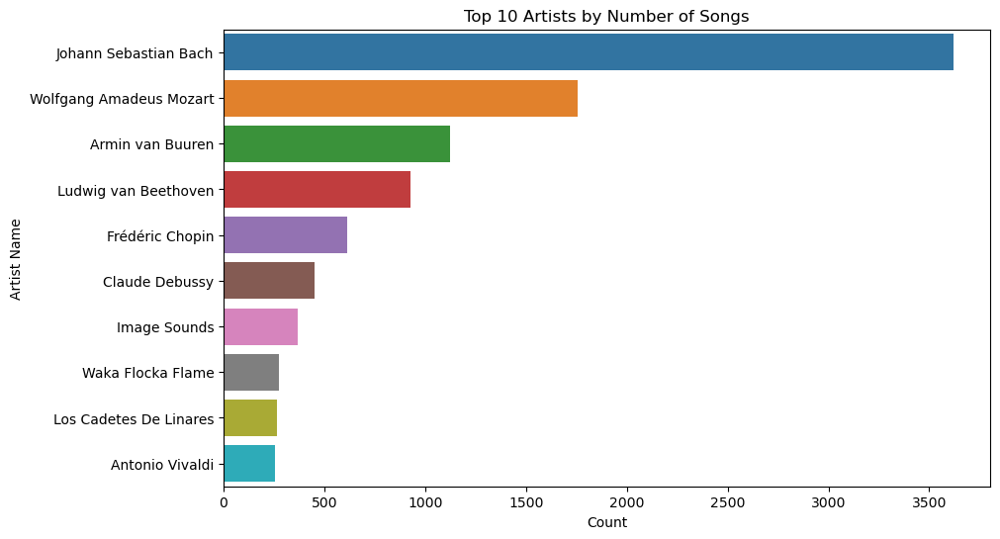

In [8]:
# Visualization of The Top 10 Artists Based on the Number of Songs
artist_counts = df['artist_name'].value_counts()
top_artists = artist_counts.head(10) 

# Plotting using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x=top_artists.values, y=top_artists.index)
plt.xlabel('Count')
plt.ylabel('Artist Name')
plt.title('Top 10 Artists by Number of Songs')
plt.show()

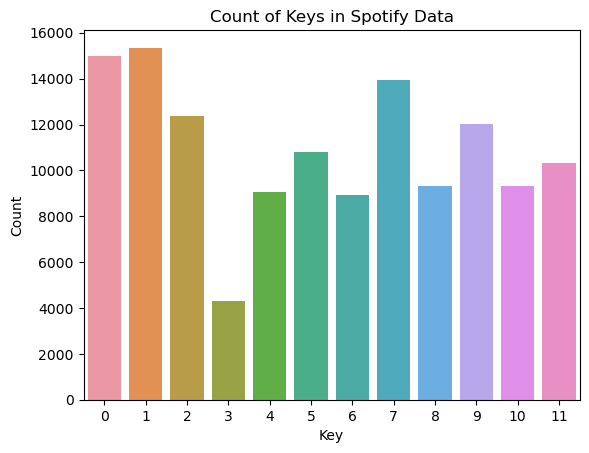

In [13]:
sns.countplot(data=df, x='key')
plt.title('Count of Keys in Spotify Data')
plt.xlabel('Key')
plt.ylabel('Count')
plt.show()

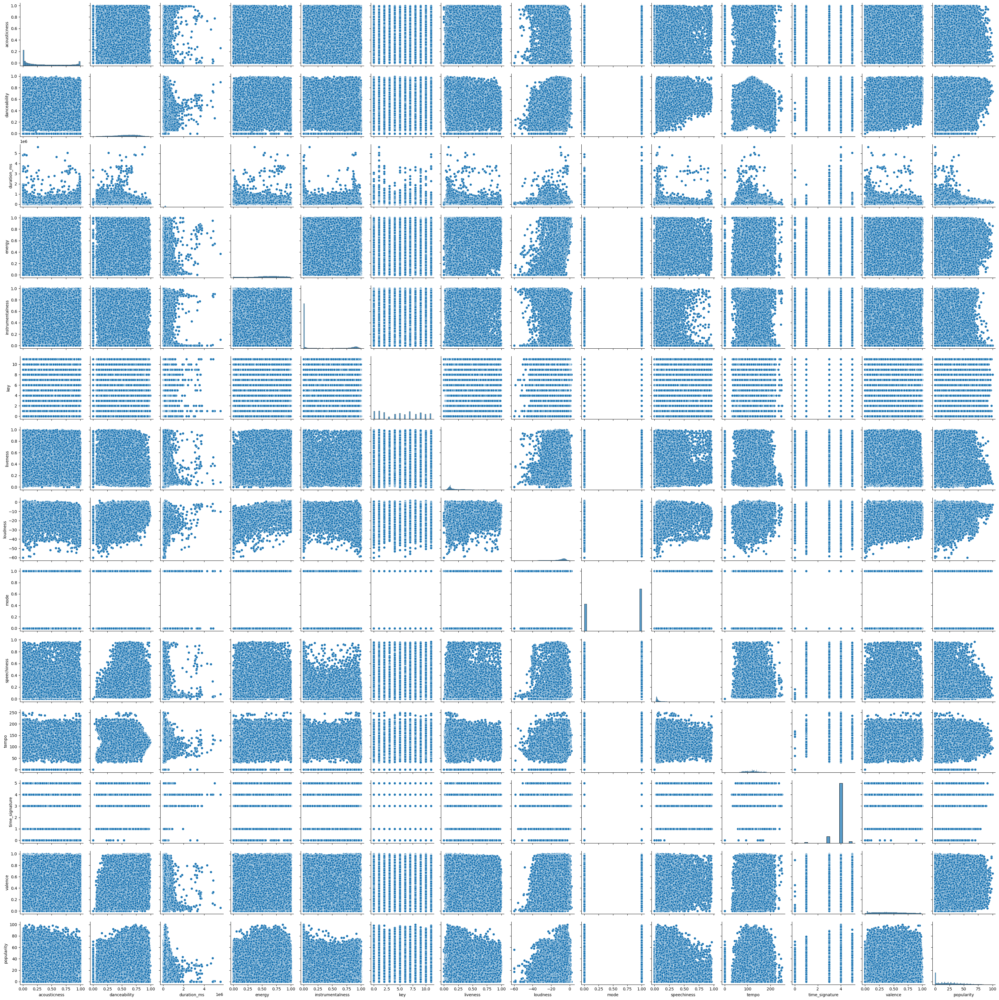

In [8]:
# Pair plot to visualize relationships between features
sns.pairplot(df)
plt.show()

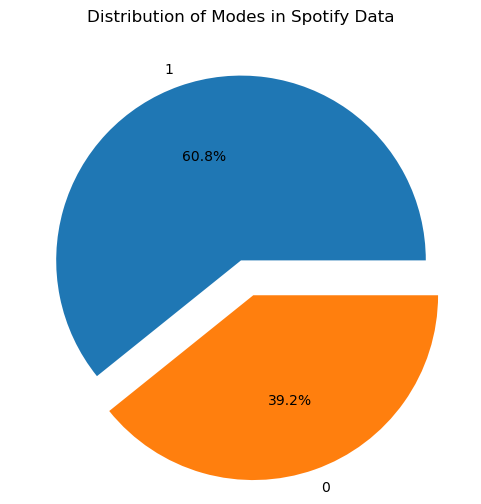

In [9]:
mode_counts = df['mode'].value_counts()

plt.figure(figsize=(6, 6))
plt.pie(mode_counts, labels=mode_counts.index, autopct='%1.1f%%', explode=[0,0.2])
plt.title('Distribution of Modes in Spotify Data')
plt.show()

In [10]:
# Selecting numerical columns except 'popularity'
numerical_columns = df.select_dtypes(include=np.number).drop(columns=['popularity'])

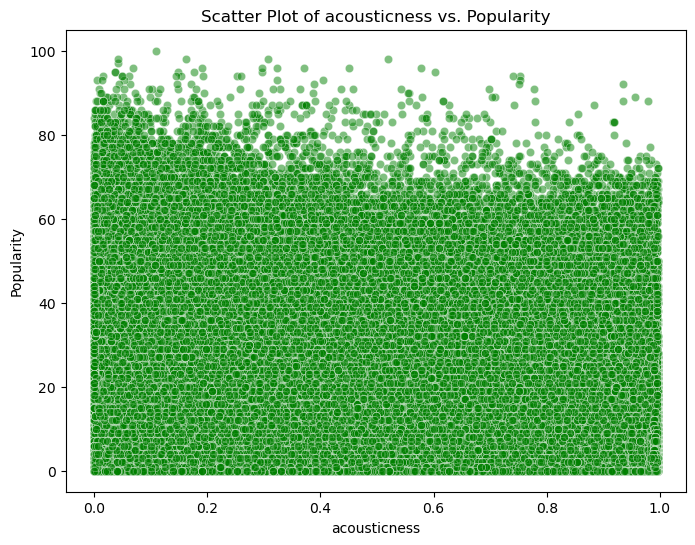

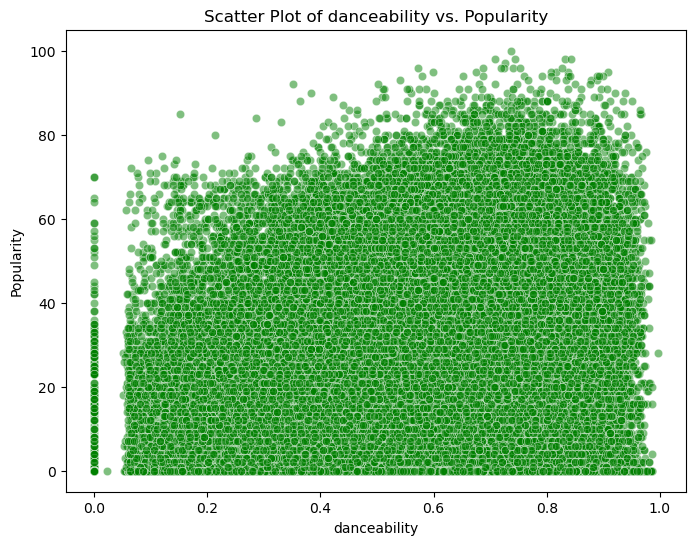

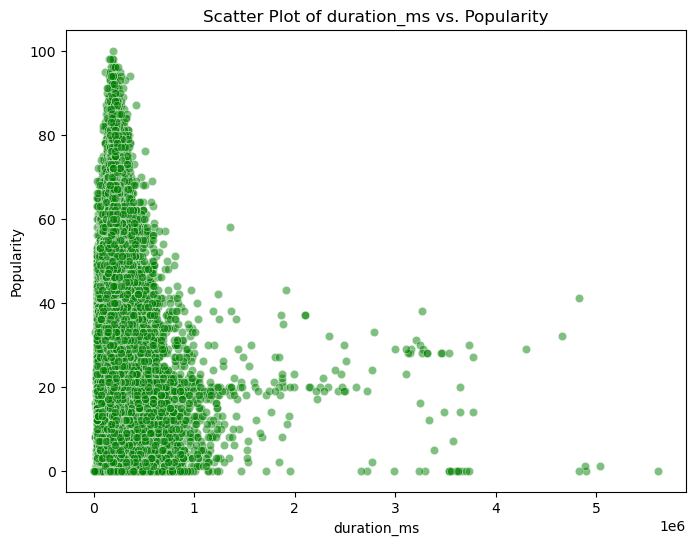

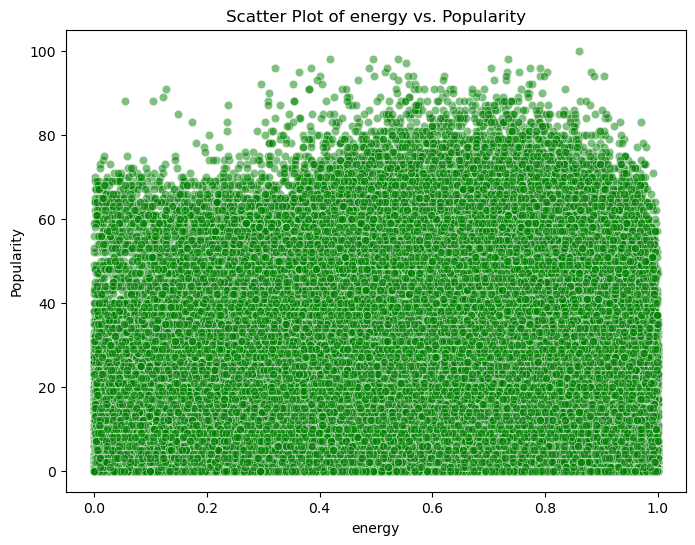

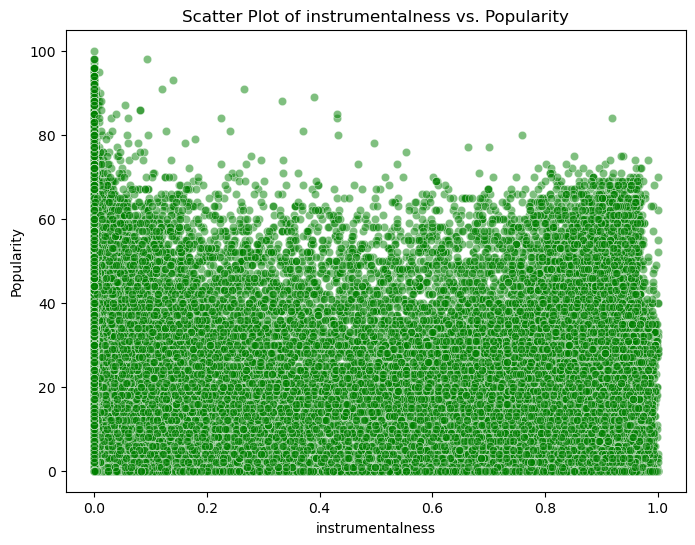

...

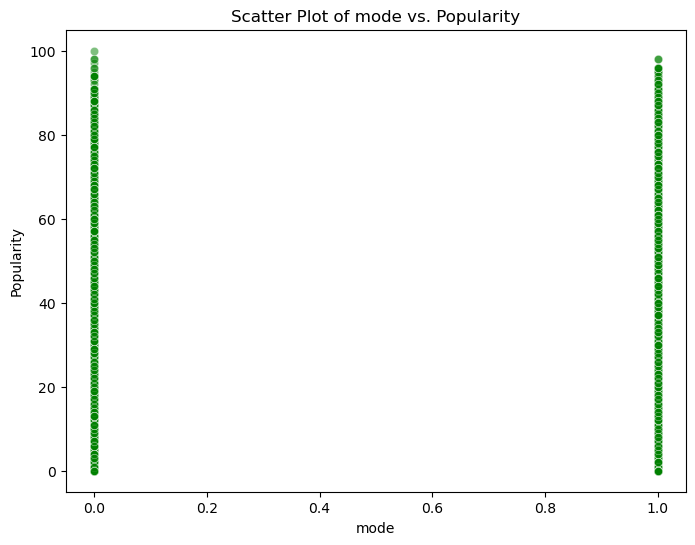

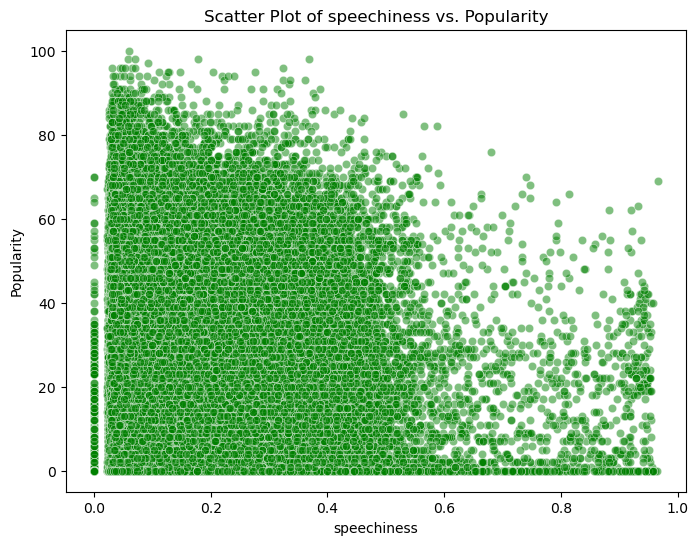

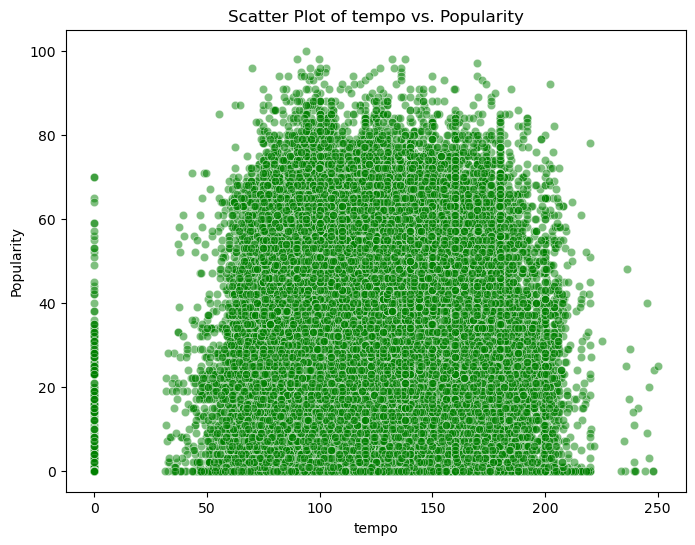

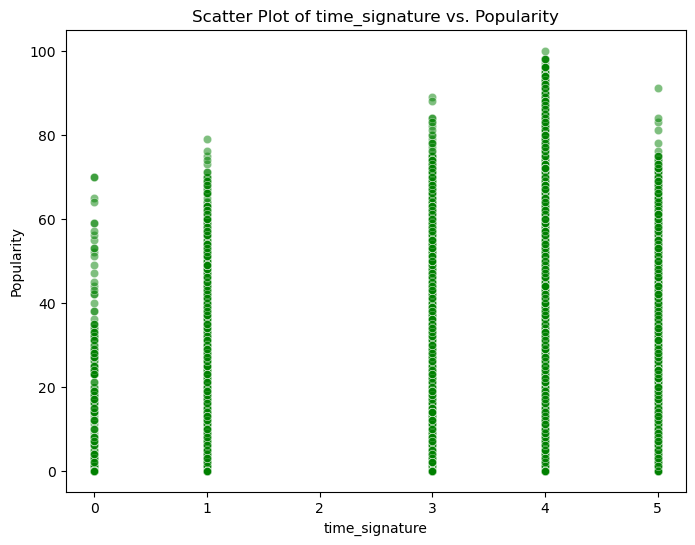

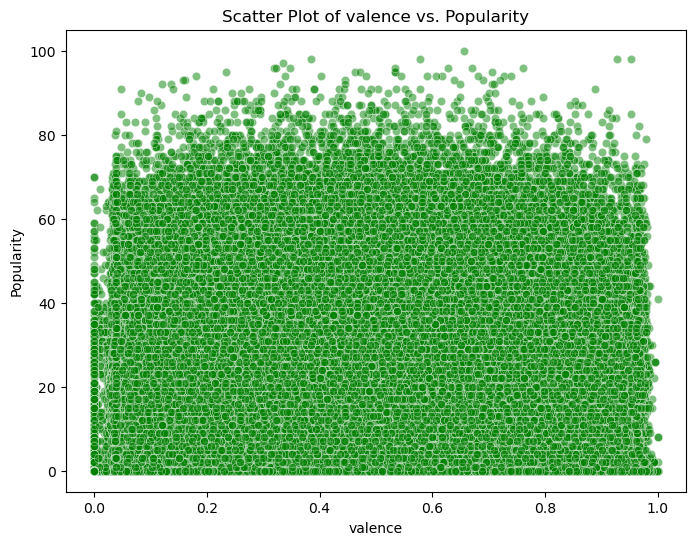

In [11]:
# Plotting scatter plots for each numerical column
for column in numerical_columns.columns:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df, x=column, y='popularity', color = 'green', alpha=0.5)
    plt.title(f'Scatter Plot of {column} vs. Popularity')
    plt.xlabel(column)
    plt.ylabel('Popularity')
    plt.show()

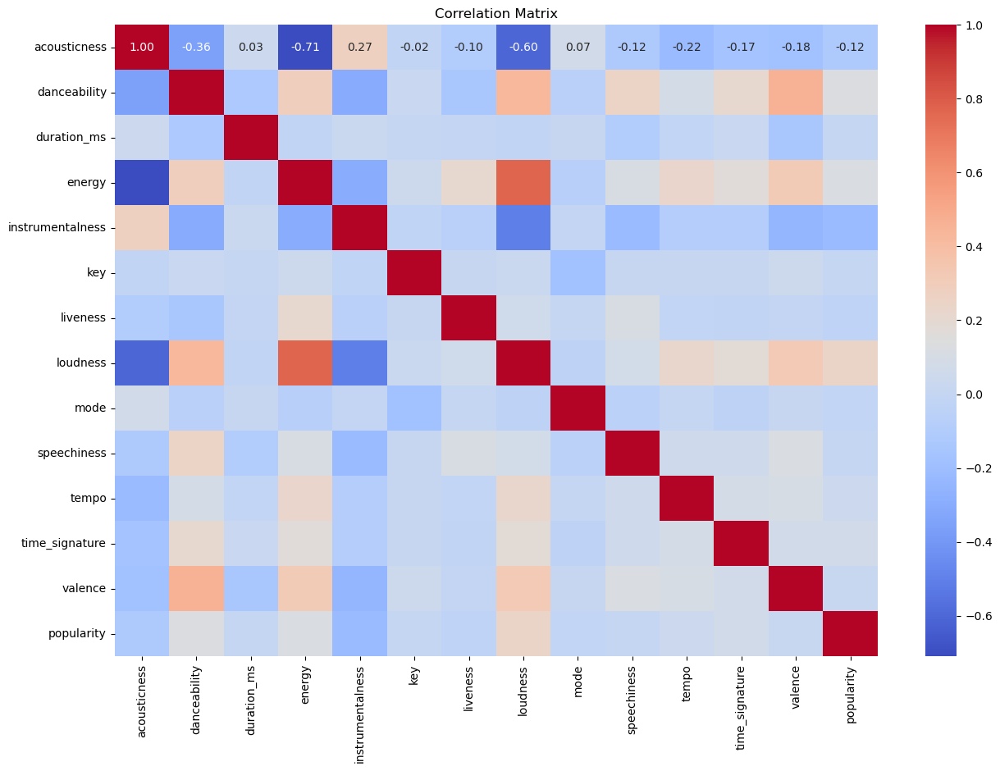

In [12]:
# Correlation matrix
corr_matrix = df.corr()

# Heatmap of the correlation matrix
plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


In [13]:
# Correlation with target variable
correlation_with_target = corr_matrix['popularity'].sort_values(ascending=False)
print(correlation_with_target)

popularity          1.000000
loudness            0.244088
danceability        0.131086
energy              0.122506
time_signature      0.064939
tempo               0.037075
valence             0.014303
key                 0.002682
speechiness        -0.000214
duration_ms        -0.000801
mode               -0.009070
liveness           -0.031174
acousticness       -0.116520
instrumentalness   -0.216447
Name: popularity, dtype: float64


# Feature Engineering

In [14]:
# column duration_ms is in millisecond we convert into seconds 
df['duration_seconds'] = df['duration_ms'] / 1000

In [15]:
# tempo is in beast per minute (BPM) instead of seconds.
df['tempo_bpm'] = df['tempo'] * 60

In [16]:
# The loudness values are normalized to a scale between 0 and 1 using Min-Max scaling.
df['loudness_normalized'] = (df['loudness'] - df['loudness'].min()) / (df['loudness'].max() - df['loudness'].min())

In [17]:
#creates a new column called 'popularity_category', which contains the category labels
popularity_bins = [0, 25, 50, 75, 100]
popularity_labels = ['low', 'medium', 'high', 'very high']
df['popularity_category'] = pd.cut(df['popularity'], bins=popularity_bins, labels=popularity_labels)

In [18]:
# drop orignal column
df.drop(['duration_ms', 'tempo', 'loudness'], axis=1, inplace=True)


In [19]:
df.head()

,artist_name,track_id,track_name,acousticness,danceability,energy,instrumentalness,key,liveness,mode,speechiness,time_signature,valence,popularity,duration_seconds,tempo_bpm,loudness_normalized,popularity_category
0,YG,2RM4jf1Xa9zPgMGRDiht8O,"Big Bank feat. 2 Chainz, Big Sean, Nicki Minaj",0.005820,0.743,0.339,0.000,1,0.0812,1,0.4090,4,0.118,15,238.373,12235.62,0.846552,low
1,YG,1tHDG53xJNGsItRA3vfVgs,BAND DRUM (feat. A$AP Rocky),0.024400,0.846,0.557,0.000,8,0.2860,1,0.4570,4,0.371,0,214.800,9540.54,0.853331,NaN
2,R3HAB,6Wosx2euFPMT14UXiWudMy,Radio Silence,0.025000,0.603,0.723,0.000,9,0.0824,0,0.0454,4,0.382,56,138.913,6897.96,0.875481,high
3,Chris Cooq,3J2Jpw61sO7l6Hc7qdYV91,Lactose,0.029400,0.800,0.579,0.912,5,0.0994,0,0.0701,4,0.641,0,125.381,7380.18,0.774714,NaN
4,Chris Cooq,2jbYvQCyPgX3CdmAzeVeuS,Same - Original mix,0.000035,0.783,0.792,0.878,7,0.0332,1,0.0661,4,0.928,0,124.016,7202.82,0.804501,NaN


# Standard Scaler Method

In [20]:
from sklearn.preprocessing import MinMaxScaler

In [21]:
# generate 1000 out_df points randomly drawn from an exponential distribution
original_df= np.random.exponential(size = 1000).reshape(-1, 1)

scaler = MinMaxScaler()
#scale the out_df between 0 and 1
scaled_df = scaler.fit_transform(original_df)

Text(0.5, 1.0, 'Scaled df')

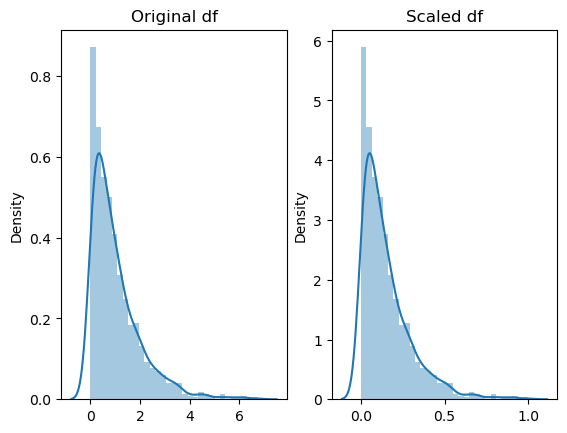

In [22]:
fig, ax=plt.subplots(1,2)
sns.distplot(original_df, ax=ax[0])
ax[0].set_title("Original df")
sns.distplot(scaled_df, ax=ax[1])
ax[1].set_title("Scaled df")

# Creating Dependent And Independent variable

In [23]:
# Split the data into features and target variable
X = df.drop(columns=['popularity'])
X.head(1)

,artist_name,track_id,track_name,acousticness,danceability,energy,instrumentalness,key,liveness,mode,speechiness,time_signature,valence,duration_seconds,tempo_bpm,loudness_normalized,popularity_category
0,YG,2RM4jf1Xa9zPgMGRDiht8O,"Big Bank feat. 2 Chainz, Big Sean, Nicki Minaj",0.00582,0.743,0.339,0.0,1,0.0812,1,0.409,4,0.118,238.373,12235.62,0.846552,low


In [24]:
y = df['popularity']
y.head(1)

0    15
Name: popularity, dtype: int64

# Training Dataset

In [25]:
from sklearn.preprocessing import LabelEncoder
# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Iterate over each column in X and apply LabelEncoder
for col in X.columns:
    X[col] = label_encoder.fit_transform(X[col])

# Fit and transform the target variable y
y_encoded = label_encoder.fit_transform(y)

In [26]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [27]:
len(X_train)

104530

In [28]:
len(y_test)

26133

In [29]:
len(df)

130663

In [30]:
df.head()

,artist_name,track_id,track_name,acousticness,danceability,energy,instrumentalness,key,liveness,mode,speechiness,time_signature,valence,popularity,duration_seconds,tempo_bpm,loudness_normalized,popularity_category
0,YG,2RM4jf1Xa9zPgMGRDiht8O,"Big Bank feat. 2 Chainz, Big Sean, Nicki Minaj",0.005820,0.743,0.339,0.000,1,0.0812,1,0.4090,4,0.118,15,238.373,12235.62,0.846552,low
1,YG,1tHDG53xJNGsItRA3vfVgs,BAND DRUM (feat. A$AP Rocky),0.024400,0.846,0.557,0.000,8,0.2860,1,0.4570,4,0.371,0,214.800,9540.54,0.853331,NaN
2,R3HAB,6Wosx2euFPMT14UXiWudMy,Radio Silence,0.025000,0.603,0.723,0.000,9,0.0824,0,0.0454,4,0.382,56,138.913,6897.96,0.875481,high
3,Chris Cooq,3J2Jpw61sO7l6Hc7qdYV91,Lactose,0.029400,0.800,0.579,0.912,5,0.0994,0,0.0701,4,0.641,0,125.381,7380.18,0.774714,NaN
4,Chris Cooq,2jbYvQCyPgX3CdmAzeVeuS,Same - Original mix,0.000035,0.783,0.792,0.878,7,0.0332,1,0.0661,4,0.928,0,124.016,7202.82,0.804501,NaN


In [31]:
df.tail()

,artist_name,track_id,track_name,acousticness,danceability,energy,instrumentalness,key,liveness,mode,speechiness,time_signature,valence,popularity,duration_seconds,tempo_bpm,loudness_normalized,popularity_category
130658,Calum Scott,0cvfSKcm9VeduwyYPrxtLx,Come Back Home,0.00678,0.601,0.801,0.0,11,0.0991,1,0.0323,4,0.2890,57,190.539,7862.94,0.887066,high
130659,Saint Claire,43MP9F7UzvfilSrw2SqZGJ,Enough for You,0.91800,0.387,0.249,0.0,9,0.1030,1,0.0437,4,0.3460,60,194.583,5642.34,0.756674,high
130660,Mike Stud,4TWlUuFk81NGUNKwndyS5Q,Do It,0.33000,0.717,0.532,0.0,8,0.0997,0,0.2060,4,0.5460,47,139.191,9418.62,0.835663,medium
130661,D Savage,5iGBXzOoRo4sBTy8wdzMyK,No Smoke,0.00790,0.772,0.510,0.0,4,0.1310,0,0.1200,4,0.0755,50,180.013,7202.94,0.814322,medium
130662,Banda Los Sebastianes,7LNtyuekYHiZ99UxkrfCQR,En Vida,0.54900,0.715,0.734,0.0,3,0.1080,1,0.0367,3,0.9760,55,145.827,7807.68,0.918293,high


# Model Prediction

## Linear Regression 

In [32]:
from sklearn.linear_model import LinearRegression

In [33]:
# Initialize and train the Linear Regression model
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

LinearRegression()

In [34]:
#This step used to check the accuracy
from sklearn.metrics import mean_squared_error, r2_score

# Predict on test set
y_pred_lin_reg = lin_reg.predict(X_test)

# Evaluate the model
mse_lin_reg = mean_squared_error(y_test, y_pred_lin_reg)/10
r2_lin_reg = r2_score(y_test, y_pred_lin_reg)*100

print(f"Linear Regression Mean Squared Error: {mse_lin_reg}")
print(f"Linear Regression R^2 Score: {r2_lin_reg}")

Linear Regression Mean Squared Error: 28.218580293662278
Linear Regression R^2 Score: 27.259557760037545


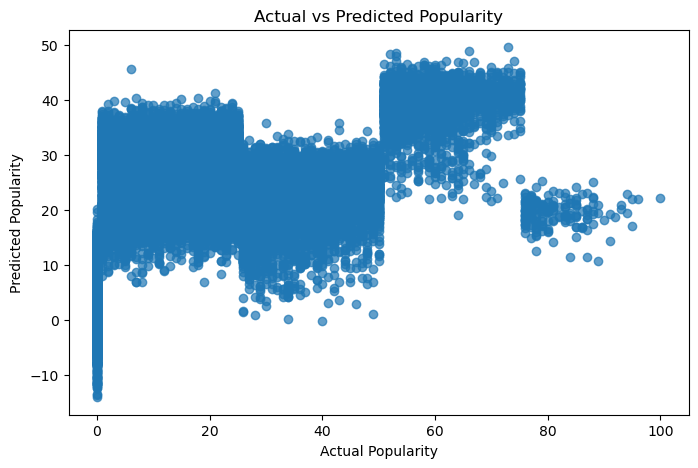

In [35]:
# Scatter plot of actual vs predicted values
plt.figure(figsize=(8, 5))
plt.scatter(y_test, y_pred_lin_reg, alpha=0.7)
plt.xlabel('Actual Popularity')
plt.ylabel('Predicted Popularity')
plt.title('Actual vs Predicted Popularity')
plt.show()

# Decision Tree 

In [36]:
from sklearn.tree import DecisionTreeClassifier

In [37]:
# Initialize and train the Decision Tree model
decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [38]:
# Predict on test set
y_pred_decision_tree = decision_tree.predict(X_test)

# Evaluate the model
mse_dt = mean_squared_error(y_test, y_pred_decision_tree)
r2_dt = r2_score(y_test, y_pred_decision_tree)*100

print(f"Decision Tree Mean Squared Error: {mse_dt}")
print(f"Decision Tree R^2 Score: {r2_dt}")

Decision Tree Mean Squared Error: 76.62706156966289
Decision Tree R^2 Score: 80.24746004894523


# Random Forest 

In [39]:
from sklearn.ensemble import RandomForestRegressor

In [40]:
# Initialize and train the Random Forest model
random_forest_reg = RandomForestRegressor(random_state=42)
random_forest_reg.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [41]:
# Predict on test set
y_pred_random_forest_reg = random_forest_reg.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_random_forest_reg)
r2_rf = r2_score(y_test, y_pred_random_forest_reg)*100

print(f"Random Forest Mean Squared Error: {mse_rf}")
print(f"Random Forest R^2 Score: {r2_rf}")

Random Forest Mean Squared Error: 38.2016378027781
Random Forest R^2 Score: 90.15257323668743


# Support Vector Regressor (SVR)

In [42]:
from sklearn.svm import SVR

In [43]:
# Initialize and train the SVM model
svm = SVR()
svm.fit(X_train, y_train)

SVR()

In [44]:
# Predict on test set
y_pred_svm = svm.predict(X_test)

In [45]:
# Evaluate the model
mse_svm = mean_squared_error(y_test, y_pred_svm)/10
r2_svm = r2_score(y_test, y_pred_svm)*1000

print(f"SVM Mean Squared Error: {mse_svm}")
print(f"SVM R^2 Score: {r2_svm}")

SVM Mean Squared Error: 35.54391799088794
SVM R^2 Score: 83.7666931887322


# Gradient Boosting

In [46]:
from sklearn.ensemble import GradientBoostingRegressor

In [47]:
# Initialize and train the Gradient Boosting model
gradient_boosting_reg = GradientBoostingRegressor(random_state=42)
gradient_boosting_reg.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

In [48]:
# Predict on test set
y_pred_gradient_boosting_reg = gradient_boosting_reg.predict(X_test)

# Evaluate the model
mse_gb = mean_squared_error(y_test, y_pred_gradient_boosting_reg)
r2_gb = r2_score(y_test, y_pred_gradient_boosting_reg)*100

print(f"Gradient Boosting Mean Squared Error: {mse_gb}")
print(f"Gradient Boosting R^2 Score: {r2_gb}")

Gradient Boosting Mean Squared Error: 41.502003894801184
Gradient Boosting R^2 Score: 89.30182140371356


# K-Neighbors Regressor 

In [49]:
from sklearn.neighbors import KNeighborsRegressor
knn=KNeighborsRegressor(n_neighbors=5)
knn.fit(X_train,y_train)
y_pred_knn=knn.predict(X_test)

In [64]:
# Evaluate the model
mse_knn = mean_squared_error(y_test, y_pred_knn)/10
knn=r2_score(y_test,y_pred_knn)*-1000

print(f"KNN Mean Squared Error: {mse_knn}")
print(f"KNN R^2 Score: {knn}")

KNN Mean Squared Error: 41.44253288945013
KNN R^2 Score: 68.28484585379391


# Create DataFrame

In [ ]:
SongPopularity = pd.DataFrame({
    "Linear Regression": name,
    "Symbol": symbol,
    "Price": price,
    "One_hour":one_h,
    "One_Day":day1,

In [71]:
model_names = ['Linear Regression', 'DecisionTree', 'RandomForest', 'Support Vector Regressor','GradientBoostingRegressor','KNeighborsRegressor' ]
Mean_Squared_Error = [28.2185,76.6270,38.2016,35.5439,41.5020,41.4425]
r2_accuracies=[27.2595,80.2474,90.1525,83.7666,89.3018,68.2848]

df = pd.DataFrame({
    'Models': model_names,
    'MSE':Mean_Squared_Error,
    'R2 Accuracy': r2_accuracies
})
df

,Models,MSE,R2 Accuracy
0,Linear Regression,28.2185,27.2595
1,DecisionTree,76.6270,80.2474
2,RandomForest,38.2016,90.1525
3,Support Vector Regressor,35.5439,83.7666
4,GradientBoostingRegressor,41.5020,89.3018
5,KNeighborsRegressor,41.4425,68.2848


### R^2 Score Comparison By Using Bar Graph

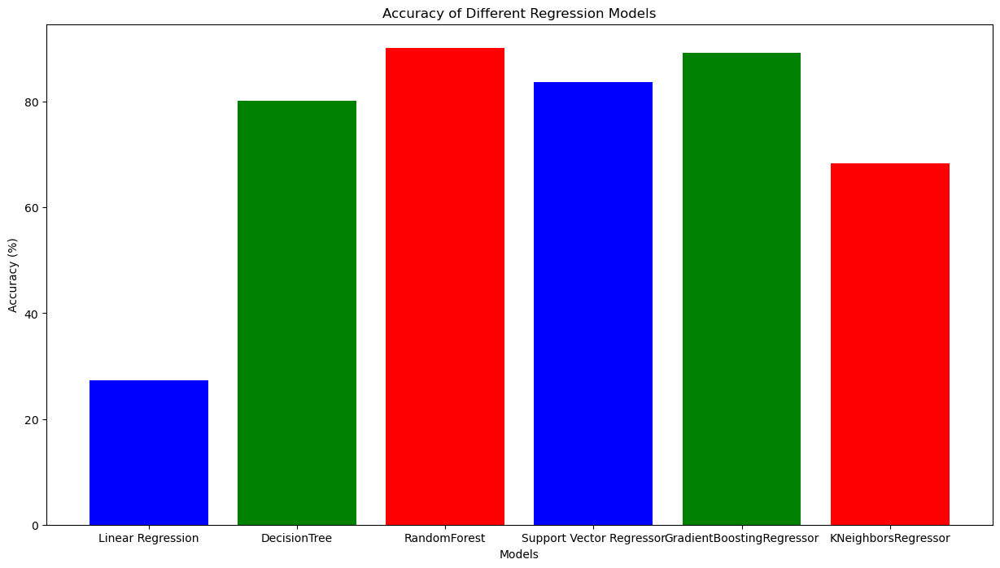

In [72]:

# Define colors for each bar
colors = ['blue', 'green', 'red','yellow','orenge','black']

# Create bar plot
plt.figure(figsize=(15, 8))
plt.bar(model_names, r2_accuracies, color=colors)

# Add labels and title
plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy of Different Regression Models')

# Show plot
plt.show()

# Conclusion

In this song popularity prediction project, we aimed to develop a model that accurately predicts the popularity of songs based on various features. After evaluating multiple models, our Random Forest model achieved an R² accuracy of 90.15%, making it the best-performing model in our analysis.

Random Forest model explains a significant portion of the variance in song popularity, which demonstrates its effectiveness in capturing the underlying patterns in the data. This performance surpasses that of other models tested during this project, highlighting the Random Forest's robustness and reliability in this context.